In [1]:
from google.colab import auth
auth.authenticate_user()

project_id = 'spearsx'
!gcloud config set project {project_id}
!gsutil -m cp gs://chesspic-assets/datasets/2023-06-20-cropped-boards-fen.zip .
!gsutil -m cp gs://chesspic-assets/datasets/2023-07-02-synthetic-2D-boards-balanced-512x512.zip .
!unzip 2023-06-20-cropped-boards-fen.zip
!unzip 2023-07-02-synthetic-2D-boards-balanced-512x512.zip

Streaming output truncated to the last 5000 lines.
  inflating: synthetic-boards/PQpqnbq1-nR1nRNQ1-bBnRbpKP-1rQQQrN1-pqKqkRbP-rBpqNBrR-KbkBKbrr-BNRPPbRr.png  
  inflating: synthetic-boards/bQp1PkKN-ppbBQKQr-qpNKNqQR-QnNrnQkP-PpRNPKBB-kpnk1bKk-QBBNbbBn-BQR1Nqrk.png  
  inflating: synthetic-boards/RP1BrRbr-pPBkQ1kq-pRbqrnqr-QNQnqnkK-QNBNBBBN-kkbKpRbk-BQrrBPBb-RQPKrpN1.png  
  inflating: synthetic-boards/K1nqQNBN-RqNNNnNR-rBrkPrqR-rkrk1KRK-BQPQNRrP-P1KQPNbr-pNqpprnb-qBpnB1QP.png  
  inflating: synthetic-boards/knB1QbqP-bQRPbKRq-pBQNkqbK-nkPnrNqQ-bKqnRnnq-P1KnkKnK-1kpKB1qq-KqbQkBKn.png  
  inflating: synthetic-boards/qBpPrkqq-K1nKpbkr-qQprrnRq-BbNKQpqQ-BkNK2br-npp1NQKK-PqQPRnNR-pnQqrNbN.png  
  inflating: synthetic-boards/bk1KBpQB-kBrqknKb-nKqrNPbN-p2b1N1R-BqRqrkPk-K1R1bNPk-nQPPkBnq-BbBkpRkk.png  
  inflating: synthetic-boards/KKpbPbp1-RP1bQBBr-1rKN1Qrr-1NRNKqRQ-nnpPpPQn-PbBNqNbq-1qBrRKqQ-QbpknNRK.png  
  inflating: synthetic-boards/1qqNb2q-QBnRBNrq-qBr1RQkb-RpR1qqNr-KnKPBBPn-PkqBNRpq-nPb1

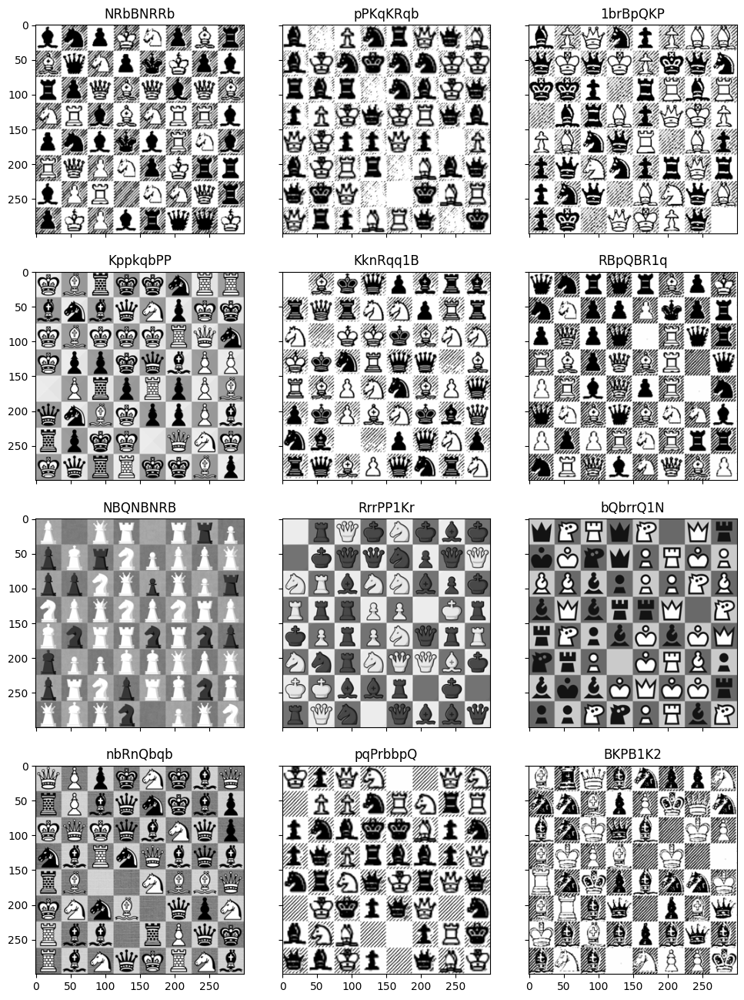

In [2]:
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import Image
import random

fig = plt.figure(figsize=(16., 16.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(4, 3),  # creates 2x2 grid of axes
                 axes_pad=0.5,  # pad between axes in inch.
                 )

# image_dir = "cropped-boards-fen"
image_dir = "synthetic-boards"
images = glob.glob(os.path.join(image_dir, "*.png"))

for ax in grid:
  file_names = random.sample(images, 1)
  file_name = file_names[0]
  img = Image.open(file_name)
  img = img.resize((300,300))
  img = img.convert('L')
  ax.imshow(img, cmap='gray')
  ax.set_title(os.path.basename(file_name).split("-")[3])
plt.show()

In [3]:
!pip uninstall --yes torch torchvision torchaudio
!pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
!pip install pytorch-lightning chess

Found existing installation: torch 2.0.1+cu118
Uninstalling torch-2.0.1+cu118:
  Successfully uninstalled torch-2.0.1+cu118
Found existing installation: torchvision 0.15.2+cu118
Uninstalling torchvision-0.15.2+cu118:
  Successfully uninstalled torchvision-0.15.2+cu118
Found existing installation: torchaudio 2.0.2+cu118
Uninstalling torchaudio-2.0.2+cu118:
  Successfully uninstalled torchaudio-2.0.2+cu118
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 99.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 100.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 72.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 74.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 106.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━

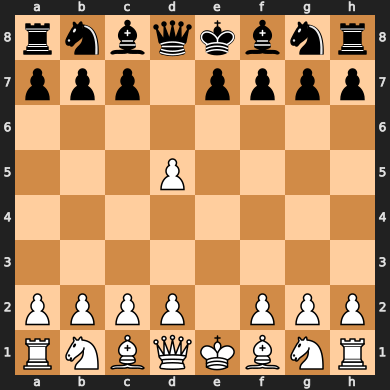

In [4]:
import os, random
import chess
import numpy as np
from pathlib import Path

class Board:

    def __init__(self, board):
        self.board = board

    @classmethod
    def from_file_name(cls, file_name):
        fen = Path(file_name).stem
        fen = fen.replace("-", "/") + " w KQkq - 0 1"
        board = chess.Board(fen=fen)
        return Board(board)

    @classmethod
    def from_array(cls, a):
        board = chess.Board()
        board.clear()
        for file in range(8):
            for rank in range(8):
                i = a[rank][file]
                if i == 0:
                    continue
                sq = (rank * 8) + file
                piece = Board.piece_from_int(i)
                board.set_piece_at(sq, piece)
        return Board(board)

    @classmethod
    def from_prediction(cls, y_hat):
        y_hat = torch.argmax(y_hat, dim=2)
        y_hat = torch.reshape(y_hat, (8, 8))
        return Board.from_array(y_hat.cpu().numpy())

    @classmethod
    def piece_to_int(cls, piece):
        if piece is None:
            return 0
        return piece.piece_type if piece.color else piece.piece_type + 6

    @classmethod
    def piece_from_int(cls, i):
        if i == 0:
            return None
        piece_type = ((i-1)%6)+1
        piece_color = chess.BLACK if i > 6 else chess.WHITE
        return chess.Piece(piece_type=piece_type, color=piece_color)

    def to_array(self):
        a = np.zeros((8,8), dtype=np.int8)
        for sq, piece in self.board.piece_map().items():
            file = sq % 8
            rank = sq // 8
            a[rank][file] = Board.piece_to_int(piece)
        return a

    def to_prediction(self):
        a = torch.zeros((64,13), dtype=torch.float)
        for sq, piece in self.board.piece_map().items():
            idx = Board.piece_to_int(piece)
            a[sq][idx] = 1.0
        return a

    def flip(self):
        cp = np.copy(self.to_array())
        flipped = np.fliplr(cp)
        return Board.from_array(flipped)

    def rotate(self, n):
        cp = np.copy(self.to_array())
        rotated = np.rot90(cp, k=4-n)
        return Board.from_array(rotated)

board = Board(chess.Board("rnbqkbnr/ppp1pppp/8/3P4/8/8/PPPP1PPP/RNBQKBNR w KQkq - 0 1"))
board = Board.from_array(board.to_array())
board.board

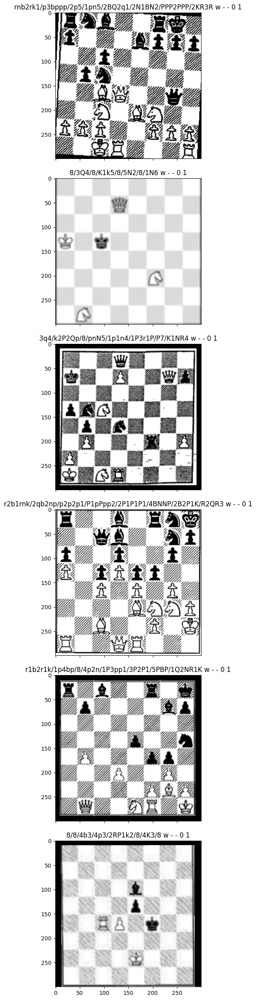

In [9]:
from torchvision.transforms.transforms import Pad
import os, glob, random
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import time
from enum import Enum

class BoardDataset(Dataset):

    def __init__(self, file_names, transform=None):
        self.file_names = file_names
        self.transform = transform

    def __len__(self):
        return len(self.file_names)

    def __getitem__(self, idx):
        file_name = self.file_names[idx]
        image = Image.open(file_name)
        board = Board.from_file_name(file_name)
        sample = {'image': image, 'board': board}
        if self.transform:
            sample = self.transform(sample)
        return sample

class FlipTransform(object):

    def __init__(self, probability=0.5):
        self.probability = probability

    def __call__(self, sample):
        image, board = sample['image'], sample['board']
        p = random.uniform(0, 1)
        flip = p <= self.probability
        if flip:
            image = ImageOps.mirror(image)
            board = board.flip()
        return {'image': image, 'board': board}

class RotateTransform(object):

    def __init__(self, options=[0,1,2,3]):
        self.options = options

    def __call__(self, sample):
        image, board = sample['image'], sample['board']
        rot = random.choice(self.options)
        board = board.rotate(rot)
        return {'image': image, 'board': board}

class RandomPixelMutation(object):
    def __init__(self, mutation_rate=0.01):
        self.mutation_rate = mutation_rate

    def __call__(self, img):
      # Convert the PIL Image to a numpy array
      img_array = np.array(img)

      # Create a mask for pixels to be mutated
      mask = np.random.choice([False, True], img_array.shape[:2], p=[1-self.mutation_rate, self.mutation_rate])

      # Randomly select new grayscale values for those pixels
      random_values = np.random.randint(0, 256, img_array.shape[:2])
      # Stack grayscale values across third dimension
      random_values = np.stack([random_values]*3, axis=-1)

      # Apply the mutation
      for i in range(3):  # for each channel
          img_array[..., i][mask] = random_values[..., i][mask]

      # Convert the mutated array back into a PIL Image and return it
      mutated_image = Image.fromarray(img_array)

      return mutated_image

class ImageTransform(object):
    def __init__(self, f=None):
        self.f = f

    def __call__(self, sample):
        image, board = sample['image'], sample['board']
        if not self.f is None:
            image = self.f(image)
        return {'image': image, 'board': board}

class TensorTransform(object):

    def __init__(self):
        self.preprocess = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def __call__(self, sample):
        image, board = sample['image'], sample['board']
        t = self.preprocess(image.copy())
        board = board.to_array().flatten().astype(int)
        return {"image":t, "board":board}

IMAGE_SIZE = (300,300)

display_transform = transforms.Compose([
    ImageTransform(f=transforms.Compose([
      transforms.Resize(IMAGE_SIZE),
      transforms.Grayscale(num_output_channels=3),
      transforms.RandomChoice(transforms=[
          transforms.Pad(padding=5),
          transforms.Pad(padding=10),
          transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 5)),
          transforms.RandomPerspective(distortion_scale=0.1, p=1.0),
          transforms.RandomRotation(degrees=(-5, 5)),
          transforms.RandomAdjustSharpness(sharpness_factor=2),
          RandomPixelMutation(mutation_rate=0.1),
      ]),
      transforms.Resize(IMAGE_SIZE),
    ])),
    FlipTransform(),
])

train_transform = transforms.Compose([
    ImageTransform(f=transforms.Compose([
      transforms.Grayscale(num_output_channels=3),
      transforms.Resize(IMAGE_SIZE),
      transforms.RandomChoice(transforms=[
          transforms.Pad(padding=5),
          transforms.Pad(padding=10),
          transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 5)),
          transforms.RandomPerspective(distortion_scale=0.1, p=1.0),
          transforms.RandomRotation(degrees=(-5, 5)),
          transforms.RandomAdjustSharpness(sharpness_factor=2),
          RandomPixelMutation(mutation_rate=0.1),
      ]),
      transforms.Resize(IMAGE_SIZE),
    ])),
    FlipTransform(),
    TensorTransform()
])

val_transform = transforms.Compose([
    ImageTransform(f=transforms.Compose([
      transforms.Grayscale(num_output_channels=3),
      transforms.Resize(IMAGE_SIZE),
    ])),
    TensorTransform()
])

# image_dir = "synthetic-boards"
image_dir = "cropped-boards-fen"
images = glob.glob(os.path.join(image_dir, "*.png"))
random.shuffle(images)
cutoff = int(len(images) * 0.7)
display_dataset = BoardDataset(images[:cutoff], transform=display_transform)
train_dataset = BoardDataset(images[:cutoff], transform=train_transform)

# image_dir = "cropped-boards-fen"
# images = glob.glob(os.path.join(image_dir, "*.png"))
val_dataset = BoardDataset(images[cutoff:], transform=val_transform)

fig = plt.figure(figsize=(32., 32.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(6, 1),  # creates 2x2 grid of axes
                 axes_pad=0.5,  # pad between axes in inch.
                 )
for ax in grid:
  idx = random.randrange(0, len(display_dataset))
  item = display_dataset[idx]
  ax.imshow(item["image"], cmap="gray")
  ax.set_title(item['board'].board.fen())
plt.show()

In [10]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [7]:
!gsutil cp gs://chesspic-assets/models/2023-07-01-chessboard-2D-balanced-fen-acc-99.ckpt .

Copying gs://chesspic-assets/models/2023-07-01-chessboard-2D-balanced-fen-acc-99.ckpt...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

- [1 files][358.7 MiB/358.7 MiB]                                                
Operation completed over 1 objects/358.7 MiB.                                    


In [13]:
import time
import pytorch_lightning as pl
import torchvision.models as models
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import ConcatDataset, DataLoader
from pytorch_lightning.callbacks import ModelCheckpoint

print(torch.__version__)

class Model(pl.LightningModule):

    def __init__(self, resnet=models.efficientnet_b5(pretrained=True), lr=0.0001):
        super().__init__()
        self.lr = lr
        self.resnet = resnet
        self.outputs = nn.Linear(1000, 64*13)
        self.loss = nn.CrossEntropyLoss()

    def forward(self, x):
        x = F.relu(self.resnet(x))
        x = self.outputs(x)
        x = torch.reshape(x, (x.shape[0], 64, 13))
        return F.softmax(x,dim=2)

    def training_step(self, batch, batch_idx):
        result = self.combined_loss(batch)
        return result["loss"]

    def validation_step(self, batch, batch_idx):
        return self.combined_loss(batch, prefix="val_")

    def combined_loss(self, batch, prefix=""):
        x = batch['image']
        output = self(x)
        results = {}
        # loss
        y = batch["board"]
        y = torch.flatten(y, end_dim=1)
        y_hat = output
        y_hat = torch.flatten(y_hat, end_dim=1)
        loss = self.loss(y_hat, y) # / pc.prediction_count()
        # accuracy
        prediction = torch.argmax(y_hat, dim=1)
        correct = torch.sum((y == prediction).float())
        accuracy = correct / prediction.shape[0]
        results[prefix + "_loss"] = loss
        results[prefix + "_accuracy"] = accuracy
        self.log(prefix + "_loss", loss, prog_bar=True)
        self.log(prefix + "_accuracy", accuracy, prog_bar=True)
        results["loss"] = loss
        return results

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)


MAX_EPOCHS = 20
model = Model.load_from_checkpoint("2023-07-01-chessboard-2D-balanced-fen-acc-99.ckpt")
# model = Model()
logger = pl.loggers.TensorBoardLogger(save_dir="lightning_logs", name="chesspic")
trainer = pl.Trainer(max_epochs=MAX_EPOCHS,logger=logger, accumulate_grad_batches=1)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=5)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)
trainer.fit(model, train_dataloaders=train_loader, val_dataloaders=val_loader)

2.0.1+cu117


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type             | Params
---------------------------------------------
0 | resnet  | EfficientNet     | 30.4 M
1 | outputs | Linear           | 832 K 
2 | loss    | CrossEntropyLoss | 0     
---------------------------------------------
31.2 M    Trainable params
0         Non-trainable params
31.2 M    Total params
124.890   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [68]:
!gsutil cp /content/lightning_logs/chesspic/version_1/checkpoints/epoch=24-step=7825.ckpt gs://chesspic-assets/models/2023-07-01-chessboard-2D-balanced-fen-acc-99.ckpt

Copying file:///content/lightning_logs/chesspic/version_1/checkpoints/epoch=24-step=7825.ckpt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/358.7 MiB.                                    


Actual


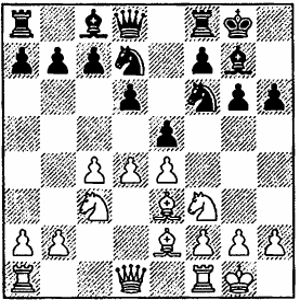

Prediction


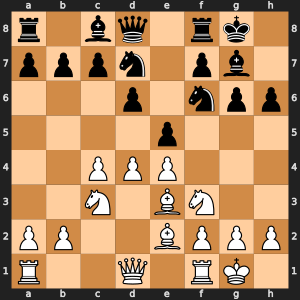

Accuracy  100.0
Actual


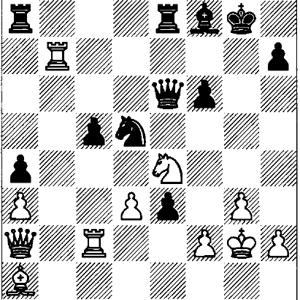

Prediction


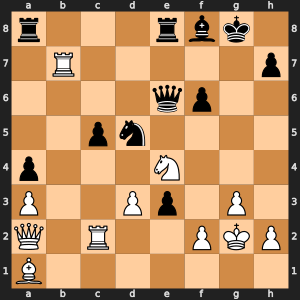

Accuracy  100.0
Actual


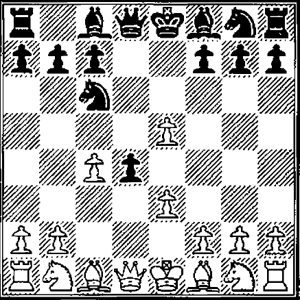

Prediction


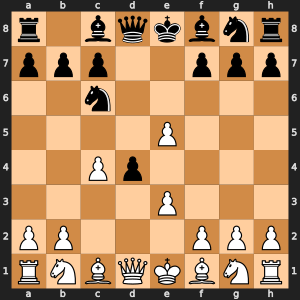

Accuracy  100.0


In [15]:
from functools import reduce
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd
import chess.svg
from IPython.display import SVG, display

# image_dir = "cropped-boards-fen"
# image_dir = "synthetic-boards"
# images = glob.glob(os.path.join(image_dir, "*.png"))

model.eval()
# model.to("cuda")
# def post_process_kings(y_hat, y_hat_board):
#     '''chess positions must have one white king and one black king'''
#     cp = y_hat_board.board.copy()
#     # set white king
#     K_sq = torch.argmax(y_hat[:,6], dim=0)
#     cp.set_piece_at(K_sq, chess.Piece.from_symbol('K'))
#     # set black king
#     k_sq = torch.argmax(y_hat[:,12], dim=0)
#     cp.set_piece_at(k_sq, chess.Piece.from_symbol('k'))
#     for sq, piece in cp.piece_map().items():
#         if sq == K_sq or sq == k_sq or piece.piece_type != chess.KING:
#             continue
#         _, indexs = torch.topk(y_hat[sq,:], 2)
#         replacement = ChessPicBoard.piece_from_int(indexs[1])
#         cp.set_piece_at(sq, replacement)
#     return ChessPicBoard(cp)

def inference(model, file, y):
    output = {"file":file}
    y_t = torch.tensor(y['board'])
    y_t = torch.reshape(y_t, (8, 8))
    y_board = Board.from_array(y_t.cpu().numpy())
    output["y_board"] = y_board

    img = y['image']
    img_batch = torch.unsqueeze(img, 0).cuda()
    y_hat = model(img_batch).data
    y_hat = torch.squeeze(y_hat)
    output["y_hat"] = y_hat
    y_hat_board = torch.argmax(y_hat, dim=1)
    y_hat_board = torch.reshape(y_hat_board, (8, 8))
    y_hat_board = Board.from_array(y_hat_board.cpu().numpy())
#     y_hat_board = post_process_kings(y_hat, y_hat_board)
    output["y_hat_board"] = y_hat_board
    return output

def show_examples(model, files, dataset, n=2):
    for i in range(n):
        idx = random.randint(0, len(files))
        output = inference(model, files[idx], dataset[idx])
        im = Image.open(output["file"]).resize((300,300))
        print("Actual")
        display(im)
        y_board = output["y_board"]
        y_hat_board = output["y_hat_board"]
        print("Prediction")
        diff_board = Board.from_array(np.abs(y_board.to_array()-y_hat_board.to_array()))
        fill_sqs = {}
        for sq, piece in diff_board.board.piece_map().items():
            fill_sqs[sq] = "#cc0000cc"
        board_img = chess.svg.board(y_hat_board.board,
                        fill=fill_sqs,
                        size=300)
        display(SVG(board_img))
        correct = np.sum(((y_board.to_array()-y_hat_board.to_array()) == 0).astype(int))
        print("Accuracy ", (correct / 64.0) * 100)
show_examples(model, images[cutoff:], val_dataset, n=3)
# show_heatmap(model, X_val, dataset_val, n=100)

In [18]:
import csv

def write_csv(model, files, dataset, file_name):
  # Open the file in write mode ('w')
  with open(file_name, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(["file", "board", "predicted", "correct", "array"])

    for i in range(len(files)):
        output = inference(model, files[i], dataset[i])
        y_board = output["y_board"]
        y_hat_board = output["y_hat_board"]
        correct = np.sum(((y_board.to_array()-y_hat_board.to_array()) == 0).astype(int))
        a = np.array2string(output["y_hat"].cpu().numpy(), separator=" ", precision=3)
        writer.writerow([files[i], y_board.board.fen(), y_hat_board.board.fen(), str(correct), a])
write_csv(model, images[cutoff:], val_dataset, "output.csv")
# show_heatmap(model, X_val, dataset_val, n=100)

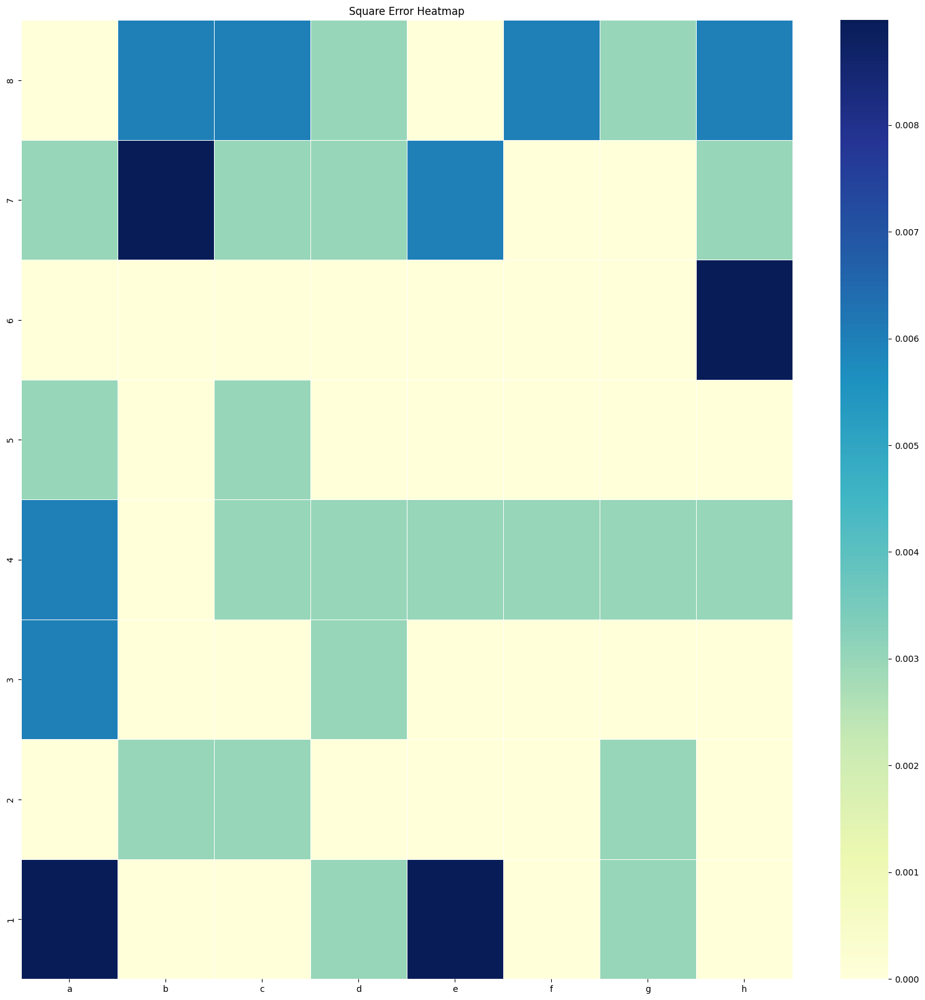

In [19]:
import seaborn as sns

df = pd.read_csv('output.csv')
sqs = {}
for sq in chess.SQUARES:
     sqs[sq] = 0

for index, row in df.iterrows():
    actual_fen = row['board']
    prediction_fen = row['predicted']
    actual_board = chess.Board(actual_fen)
    prediction_board = chess.Board(prediction_fen)
    for sq in chess.SQUARES:
        p1 = actual_board.piece_at(sq)
        p2 = prediction_board.piece_at(sq)
        if p1 != p2:
            sqs[sq] += 1

data = np.zeros((8,8))
for sq in chess.SQUARES:
    rank = 7-chess.square_rank(sq)
    file = chess.square_file(sq)
    data[rank][file] = sqs[sq] / len(df.index)
index = ["8", "7", "6", "5", "4", "3", "2", "1"]
columns = ["a", "b", "c", "d", "e", "f", "g", "h"]
df = pd.DataFrame(data, index=index, columns=columns)
plt.figure(figsize=(20, 20))
sns.heatmap(df, cmap="YlGnBu", linewidths=.5)
plt.title('Square Error Heatmap')
plt.show()


{'Empty': 0.0010559662090813093, 'P': 0.0011173184357541898, 'p': 0.002205071664829107, 'N': 0.0, 'n': 0.0, 'B': 0.0025974025974025974, 'b': 0.007832898172323759, 'R': 0.006097560975609756, 'r': 0.00816326530612245, 'Q': 0.02553191489361702, 'q': 0.02109704641350211, 'K': 0.006153846153846154, 'k': 0.0030581039755351682}


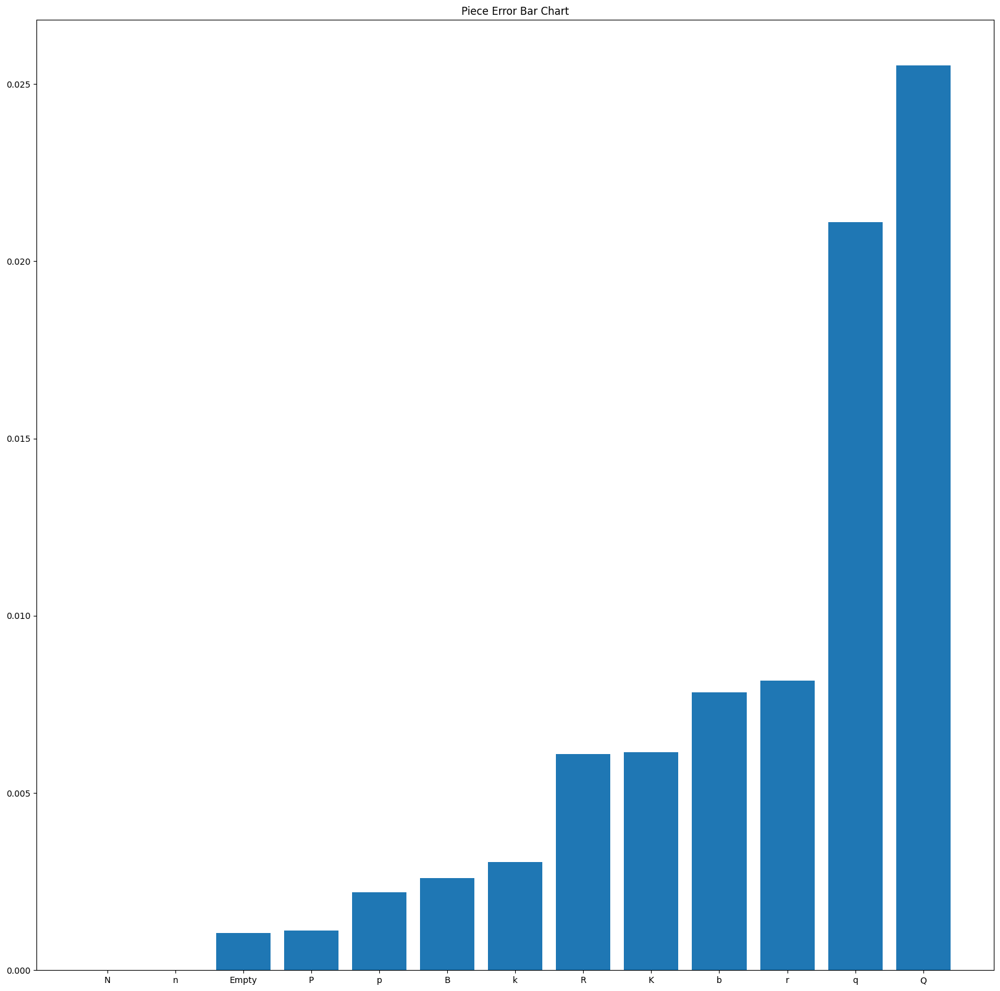

In [20]:
pieces = {"Empty":0}
piece_erors = {"Empty":0}
for piece_type in chess.PIECE_TYPES:
    for color in [chess.WHITE, chess.BLACK]:
        p = chess.Piece(piece_type=piece_type, color=color)
        pieces[p.symbol()] = 0
        piece_erors[p.symbol()] = 0

df = pd.read_csv('output.csv')
for index, row in df.iterrows():
    actual_fen = row['board']
    prediction_fen = row['predicted']
    actual_board = chess.Board(actual_fen)
    prediction_board = chess.Board(prediction_fen)
    for sq in chess.SQUARES:
        p1 = actual_board.piece_at(sq)
        if p1 is None:
            pieces["Empty"] += 1
        else:
            pieces[p1.symbol()] += 1
        p2 = prediction_board.piece_at(sq)
        if p1 != p2:
            if p1 is None:
                piece_erors["Empty"] += 1
            else:
                piece_erors[p1.symbol()] += 1

# divide piece errors by pieces to get a percentage
normalized_piece_erors = {}
for k, v in piece_erors.items():
    if pieces[k] == 0:
        normalized_piece_erors[k] = 0
    else:
        normalized_piece_erors[k] = v / pieces[k]

print(normalized_piece_erors)
# bar chart showing piece errors
normalized_piece_erors = {k: v for k, v in sorted(normalized_piece_erors.items(), key=lambda item: item[1])}
plt.figure(figsize=(20, 20))
plt.bar(normalized_piece_erors.keys(), normalized_piece_erors.values())
plt.title('Piece Error Bar Chart')
plt.show()

In [23]:
model.eval()
x = torch.rand(1, 3, 300, 300).to("cuda")
traced_model = torch.jit.trace(model.to("cuda"), x)
traced_model.save("model-gpu.pt")
!gsutil cp model-gpu.pt gs://chesspic-assets/models/2023-07-10-chessboard-2D-balanced-fen-gpu.pt

Copying file://model-gpu.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/121.3 MiB.                                    
